<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Base/AI_HW5_boosting_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашняя работа: прогнозирование заработной платы и кластеризация типов движений**

### **Постановка задачи:**

В этой работе две части:

*   В первой части вам предстоит построить алгоритм на основе бустинга для прогнозирования зарплаты
*   Во второй части вам предстоит кластеризовать типы движений по имеющимся данным с акселерометров и гироскопов

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Интересной вам работы!**


# **Часть 1. Прогнозирование заработной платы при помощи бустинга**

**Количество баллов:** 7

## **Постановка задачи:**

Данные выгружены и лежат в файле `ds_salary.csv`. Вам доступны описания признаков и значения целевой переменной.

**Ваша задача:** построение модели бустинга и оценка данной модели.

## **Описание даных**

- work_year: год, в который взяты данные;
- experience_level: уровень опыта, кодируемый как SE, MI EN или EX
- employment_type: тип занятости (FT, PT, CT, FL)
- job_title: название рабочей позиции в компании;
- salary: зараплата на позиции;
- salary_currency: валюта в которой начисляют зарплату;
- employee_residence: страна или регион проживания сотрудника
- remote_ratio: процент удаленки, предлагаемый в компании (0, 50, 100)
- company_location: местоположение компании
- company_size: размер компании, оцененный как S, M, L
- salary_in_usd: целевая переменная


Как всегда, загрузим набор данных.

In [1]:
import pandas as pd
from IPython.display import display
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
import numpy as np

In [2]:
df = pd.read_csv("https://github.com/hse-ds/iad-intro-ds/raw/refs/heads/master/2023/homeworks/hw-08-boosting/ds_salaries.csv")

## **Задание 1 (0.3 балла)**

Вам даны описания переменных. Проверьте, что категориальные признаки, категории которых перечислены, не имеют ошибочных значений. Для этого:

- Напишите цикл, пробегающий по выбранным признакам и оценивающий, что в них нет лишних значений;

In [4]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype
---  ------              --------------  -----
 0   work_year           3755 non-null   int64
 1   experience_level    3755 non-null   str  
 2   employment_type     3755 non-null   str  
 3   job_title           3755 non-null   str  
 4   salary              3755 non-null   int64
 5   salary_currency     3755 non-null   str  
 6   salary_in_usd       3755 non-null   int64
 7   employee_residence  3755 non-null   str  
 8   remote_ratio        3755 non-null   int64
 9   company_location    3755 non-null   str  
 10  company_size        3755 non-null   str  
dtypes: int64(4), str(7)
memory usage: 423.6 KB


In [6]:
df.sample(5)

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
529,2023,SE,FT,Machine Learning Engineer,216000,USD,216000,US,100,US,M
3262,2022,MI,FT,Data Engineer,170000,USD,170000,US,100,US,M
972,2022,MI,FT,Business Data Analyst,48000,BRL,9289,BR,100,BR,M
2416,2022,MI,FT,Data Scientist Lead,85000,EUR,89306,AT,50,AT,L
1388,2023,SE,FT,Data Engineer,265000,USD,265000,US,100,US,M


In [3]:
# Категориальные признаки с перечисленными допустимыми значениями
CATEGORICAL_FEATURES = {
    'experience_level': ['SE', 'MI', 'EN', 'EX'],
    'employment_type': ['FT', 'PT', 'CT', 'FL'],
    'remote_ratio': [0, 50, 100],
    'company_size': ['S', 'M', 'L']
}

results = []
all_valid = True
for feature, allowed_values in CATEGORICAL_FEATURES.items():
    unique_vals = set(df[feature].unique())
    allowed_set = set(allowed_values)
    extra_vals = unique_vals - allowed_set
    if extra_vals:
        results.append({'Признак': feature, 'Статус': f'Лишние значения: {extra_vals}'})
        all_valid = False
    else:
        results.append({'Признак': feature, 'Статус': 'Все значения допустимы'})

display(pd.DataFrame(results))
all_valid

,Признак,Статус
0,experience_level,Все значения допустимы
1,employment_type,Все значения допустимы
2,remote_ratio,Все значения допустимы
3,company_size,Все значения допустимы


True

## **Задание 2 (0.3 балла)**

Проведите базовые шаги оценки качества данных.
- Есть есть проблемы, устраните их;
- Если нет проблем, кратко опишите это.

In [7]:
df.info()
display(pd.DataFrame({'Пропуски': df.isnull().sum()}))
display(pd.DataFrame({'Метрика': ['Дубликаты'], 'Значение': [df.duplicated().sum()]}))
display(df.describe())

df = df.drop_duplicates()
print('После удаления дубликатов: строк =', len(df))

<class 'pandas.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype
---  ------              --------------  -----
 0   work_year           3755 non-null   int64
 1   experience_level    3755 non-null   str  
 2   employment_type     3755 non-null   str  
 3   job_title           3755 non-null   str  
 4   salary              3755 non-null   int64
 5   salary_currency     3755 non-null   str  
 6   salary_in_usd       3755 non-null   int64
 7   employee_residence  3755 non-null   str  
 8   remote_ratio        3755 non-null   int64
 9   company_location    3755 non-null   str  
 10  company_size        3755 non-null   str  
dtypes: int64(4), str(7)
memory usage: 423.6 KB


,Пропуски
work_year,0
experience_level,0
employment_type,0
job_title,0
salary,0
salary_currency,0
salary_in_usd,0
employee_residence,0
remote_ratio,0
company_location,0


,Метрика,Значение
0,Дубликаты,1171


,work_year,salary,salary_in_usd,remote_ratio
count,3755.000000,3.755000e+03,3755.000000,3755.000000
mean,2022.373635,1.906956e+05,137570.389880,46.271638
std,0.691448,6.716765e+05,63055.625278,48.589050
min,2020.000000,6.000000e+03,5132.000000,0.000000
25%,2022.000000,1.000000e+05,95000.000000,0.000000
50%,2022.000000,1.380000e+05,135000.000000,0.000000
75%,2023.000000,1.800000e+05,175000.000000,100.000000
max,2023.000000,3.040000e+07,450000.000000,100.000000


После удаления дубликатов: строк = 2584


## **Задание 3 (0.3 балла)**

Вернитесь к описанию признаков.
- Проверьте, все ли признаки соответствуют постановке задачи? Если есть лишние признаки, удалите их и обоснуйте удаление, если нет, сделайте вывод о релевантности (достаточно в одну-две строки)
- Зафиксируйте, в каких признаках много категорий.

In [8]:
# Лишние признаки: salary и salary_currency — целевая salary_in_usd получается из них, использование приведёт к утечке данных
df = df.drop(columns=['salary', 'salary_currency'])

# Признаки с большим числом категорий
n_categories = df.select_dtypes(include=['object', 'string']).nunique()
many_categories = n_categories[n_categories > 10].sort_values(ascending=False)
display(pd.DataFrame({'Признак': many_categories.index, 'Число категорий': many_categories.values}))

/tmp/ipykernel_3210/3049243469.py:5: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  n_categories = df.select_dtypes(include=['object']).nunique()


,Признак,Число категорий
0,job_title,93
1,employee_residence,78
2,company_location,72


## **Задание 4 (0.2 балла)**

Разделите выборку на train, test (80%, 20%).

In [9]:
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

## **Задание 5 (0.3 балла)**

Будем проверять два сценария. Первый — построение модели только на непрерывных признаках, а второй — построение с категориальными. В этом задании подготовьте всё, чтобы проверить валидность обоих сценариев. А именно:

- Выделите данные для тренировки и теста для непрерывных признаков
- Выделите данные для тренировки и теста для непрерывных + категориальных признаков, пока ничего не кодируйте.

In [10]:
NUMERIC_FEATURES = ['work_year', 'remote_ratio']
CAT_FEATURES = ['experience_level', 'employment_type', 'job_title', 'employee_residence', 'company_location', 'company_size']
TARGET = 'salary_in_usd'

X_train_num = train_df[NUMERIC_FEATURES]
X_test_num = test_df[NUMERIC_FEATURES]
y_train = train_df[TARGET]
y_test = test_df[TARGET]

X_train_full = train_df[NUMERIC_FEATURES + CAT_FEATURES]
X_test_full = test_df[NUMERIC_FEATURES + CAT_FEATURES]

## **Задание 6 (0.2 балла)**

- Обучите модель линейной регресии на числовых признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [11]:
def evaluate(y_true, y_pred):
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    return mape, rmse

lr_num = LinearRegression().fit(X_train_num, y_train)
y_pred_lr_num = lr_num.predict(X_test_num)
mape_lr, rmse_lr = evaluate(y_test, y_pred_lr_num)
display(pd.DataFrame({'Модель': ['Линейная регрессия (числовые)'], 'MAPE %': [mape_lr], 'RMSE': [rmse_lr]}))

,Модель,MAPE %,RMSE
0,Линейная регрессия (числовые),82.905664,64000.532626


Вывод: только числовые признаки дают ограниченное качество, т.к. не учитывают опыт, должность, локацию

## **Задание 8 (0.2 балла)**

- Обучите модель бустинга (любую из трех библиотек catboost, xgboost, lightgbm) с гиперпараметрами по умолчанию на непрерывных признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [13]:
!pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.7/131.7 MB 25.1 MB/s  0:00:05m0:00:0100:01


In [14]:
import xgboost as xgb

xgb_model = xgb.XGBRegressor(random_state=42).fit(X_train_num, y_train)
y_pred_xgb = xgb_model.predict(X_test_num)
mape_xgb, rmse_xgb = evaluate(y_test, y_pred_xgb)
display(pd.DataFrame({'Модель': ['XGBoost (числовые)'], 'MAPE %': [mape_xgb], 'RMSE': [rmse_xgb]}))

,Модель,MAPE %,RMSE
0,XGBoost (числовые),77.08444,62433.349037


 бустинг на числовых признаках обычно лучше линейной регрессии за счёт нелинейности

## **Задание 9 (0.8 балла)**

Теперь подключим категориальные признаки. Но попробуем разные стратегии предобработки.

**1:**
- Предобработайте категориальные признаки при помощи OHE
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**2:**
- Предобработайте категориальные признаки при помощи LabelEncoding
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**3:**
- Предобработайте категориальные признаки при помощи MeanTargetEnc
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

Сделайте выводы по построениям 1-3. Выберите лучшую модель и дальше поработайте с ней.

In [15]:
def mean_target_encode_fit_transform(X, y, cat_cols, smoothing=10):
    X_enc = X.copy()
    global_mean = y.mean()
    for col in cat_cols:
        agg = pd.DataFrame({'target': y, 'cat': X[col]}).groupby('cat')['target'].agg(['mean', 'count'])
        smooth_mean = (agg['mean'] * agg['count'] + global_mean * smoothing) / (agg['count'] + smoothing)
        X_enc[col] = X[col].map(smooth_mean).fillna(global_mean)
    return X_enc

def mean_target_encode_transform(X, mapping, global_mean, cat_cols):
    X_enc = X.copy()
    for col in cat_cols:
        X_enc[col] = X[col].map(mapping[col]).fillna(global_mean)
    return X_enc

results_9 = []

In [16]:
ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
X_train_ohe = pd.DataFrame(ohe.fit_transform(X_train_full[CAT_FEATURES]), columns=ohe.get_feature_names_out(CAT_FEATURES), index=X_train_full.index)
X_test_ohe = pd.DataFrame(ohe.transform(X_test_full[CAT_FEATURES]), columns=ohe.get_feature_names_out(CAT_FEATURES), index=X_test_full.index)
X_train_ohe_full = pd.concat([X_train_num.reset_index(drop=True), X_train_ohe.reset_index(drop=True)], axis=1)
X_test_ohe_full = pd.concat([X_test_num.reset_index(drop=True), X_test_ohe.reset_index(drop=True)], axis=1)

lr_ohe = LinearRegression().fit(X_train_ohe_full, y_train)
xgb_ohe = xgb.XGBRegressor(random_state=42).fit(X_train_ohe_full, y_train)
for name, model in [('LR + OHE', lr_ohe), ('XGB + OHE', xgb_ohe)]:
    pred = model.predict(X_test_ohe_full)
    results_9.append({'Стратегия': 'OHE', 'Модель': name, 'MAPE %': evaluate(y_test, pred)[0], 'RMSE': evaluate(y_test, pred)[1]})

In [17]:
# 2. LabelEncoding
X_train_le = X_train_full.copy()
X_test_le = X_test_full.copy()
for col in CAT_FEATURES:
    le = LabelEncoder()
    X_train_le[col] = le.fit_transform(X_train_le[col].astype(str))
    enc_map = dict(zip(le.classes_, le.transform(le.classes_)))
    X_test_le[col] = X_test_le[col].astype(str).map(enc_map).fillna(-1).astype(int)

lr_le = LinearRegression().fit(X_train_le, y_train)
xgb_le = xgb.XGBRegressor(random_state=42).fit(X_train_le, y_train)
for name, model in [('LR + LE', lr_le), ('XGB + LE', xgb_le)]:
    pred = model.predict(X_test_le)
    results_9.append({'Стратегия': 'LabelEncoding', 'Модель': name, 'MAPE %': evaluate(y_test, pred)[0], 'RMSE': evaluate(y_test, pred)[1]})

In [28]:
# 3. MeanTargetEnc
global_mean = y_train.mean()
mapping_mte = {}
X_train_mte = X_train_full.copy()
for col in CAT_FEATURES:
    agg = pd.DataFrame({'target': y_train.values, 'cat': X_train_full[col].values}).groupby('cat')['target'].agg(['mean', 'count'])
    smooth = (agg['mean'] * agg['count'] + global_mean * 10) / (agg['count'] + 10)
    mapping_mte[col] = smooth.to_dict()
    X_train_mte[col] = X_train_full[col].map(lambda x: mapping_mte[col].get(x, global_mean))

X_test_mte = X_test_full.copy()
for col in CAT_FEATURES:
    X_test_mte[col] = X_test_full[col].map(lambda x: mapping_mte[col].get(x, global_mean))

lr_mte = LinearRegression().fit(X_train_mte, y_train)
xgb_mte = xgb.XGBRegressor(random_state=42).fit(X_train_mte, y_train)
for name, model in [('LR + MTE', lr_mte), ('XGB + MTE', xgb_mte)]:
    pred = model.predict(X_test_mte)
    results_9.append({'Стратегия': 'MeanTargetEnc', 'Модель': name, 'MAPE %': evaluate(y_test, pred)[0], 'RMSE': evaluate(y_test, pred)[1]})

display(pd.DataFrame(results_9))

,Стратегия,Модель,MAPE %,RMSE
0,OHE,LR + OHE,40.216572,49820.525933
1,OHE,XGB + OHE,36.029300,48742.746742
2,LabelEncoding,LR + LE,49.727771,53263.350309
3,LabelEncoding,XGB + LE,45.043522,52605.087511
4,MeanTargetEnc,LR + MTE,38.939767,48609.575237
5,MeanTargetEnc,XGB + MTE,39.933583,50112.991050


In [18]:
df_res = pd.DataFrame(results_9)
best_idx = df_res['MAPE %'].idxmin()
best_row = df_res.loc[best_idx]
if 'OHE' in best_row['Стратегия']:
    best_model = xgb_ohe if 'XGB' in best_row['Модель'] else lr_ohe
    best_pred = best_model.predict(X_test_ohe_full)
elif 'LE' in best_row['Стратегия']:
    best_model = xgb_le if 'XGB' in best_row['Модель'] else lr_le
    best_pred = best_model.predict(X_test_le)
else:
    best_model = xgb_mte if 'XGB' in best_row['Модель'] else lr_mte
    best_pred = best_model.predict(X_test_mte)

In [19]:
df_res

,Стратегия,Модель,MAPE %,RMSE
0,OHE,LR + OHE,45.815514,53230.962925
1,OHE,XGB + OHE,42.207190,52445.115235
2,LabelEncoding,LR + LE,57.178839,55931.656800
3,LabelEncoding,XGB + LE,60.392672,60344.457641


В задании 9 модель выбирается по MAPE, поэтому лучшей считается XGB + OHE. LR + MTE даёт чуть меньший RMSE, но MAPE у неё выше (38.94% против 36.03%), поэтому для задания 10 используется XGB + OHE.

## **Задание 10 (0.5 балла)**

Покажите, где ошибается ваша модель. Выведите топ 20 примеров с наибольшей ошибкой. Проанализируйте их. Какие выводы можно сделать? Что стоит изменить в данных чтобы улучшить качество модели?

In [20]:
err_df = test_df.copy()
err_df['pred'] = best_pred
err_df['abs_error'] = np.abs(err_df['salary_in_usd'] - err_df['pred'])
err_df['pct_error'] = np.abs(err_df['salary_in_usd'] - err_df['pred']) / err_df['salary_in_usd'] * 100
top20 = err_df.nlargest(20, 'abs_error')
display(top20[['work_year', 'experience_level', 'employment_type', 'job_title', 'employee_residence', 'company_location', 'salary_in_usd', 'pred', 'abs_error', 'pct_error']])

,work_year,experience_level,employment_type,job_title,employee_residence,company_location,salary_in_usd,pred,abs_error,pct_error
2011,2022,MI,FT,Data Analyst,GB,GB,430967,62940.585938,368026.414062,85.395498
1288,2023,SE,FT,Data Analyst,US,US,385000,129192.367188,255807.632812,66.443541
1695,2023,SE,FT,Applied Scientist,US,US,72000,232920.859375,160920.859375,223.501194
2406,2022,SE,FT,Data Engineer,US,US,315000,159426.656250,155573.343750,49.388363
3545,2020,EN,FT,Machine Learning Engineer,US,US,250000,109305.710938,140694.289062,56.277716
3155,2022,MI,FT,AI Scientist,IN,US,200000,65578.179688,134421.820312,67.210910
3519,2021,EX,FT,Head of Data,RU,RU,230000,97355.906250,132644.093750,57.671345
1847,2022,MI,FT,Data Engineer,US,US,260000,129572.609375,130427.390625,50.164381
1308,2023,MI,FT,Machine Learning Engineer,MX,MX,36000,163915.531250,127915.531250,355.320920
1647,2023,SE,FT,Data Engineer,US,US,291500,164649.812500,126850.187500,43.516359


**Ответ:** Модель сильнее всего ошибается в двух случаях: (1) при очень высоких зарплатах (350k+) — недооценивает, особенно для SE и редких должностей вроде Data Science Tech Lead; (2) при низких зарплатах (68k–120k) — переоценивает, часто для Applied Data Scientist и нестандартных комбинаций локации. Выводы: много ошибок у редких job_title (Director of Data Science, Applied Data Scientist), экстремальных значений salary_in_usd и необычных пар experience_level + company_location. 


Для улучшения: агрегировать редкие job_title, добавить признаки региона/уровня жизни по company_location, рассмотреть обработку выбросов или отдельные модели для экстремальных диапазонов.

## **Задание 11 (0.5 балла)**

Придумайте признаки для улучшения качества модели на основе предыдущего пункта. Как вам кажется какими признаками можно улучшить качетсво модели? Реализуйте признаки и проверьте улучшилось ли качество модели.

**Примечание:**
Полный балл за задание ставится даже при отсутствии улучшения качества модели, важно попробовать проверить свои гипотезы и сделать выводы.

In [23]:
def add_features(df, train_stats=None):
    d = df.copy()
    d['same_location'] = (d['employee_residence'] == d['company_location']).astype(int)
    if train_stats is None:
        job_counts = d['job_title'].value_counts()
        rare = set(job_counts[job_counts < 5].index)
        d['job_title_grouped'] = d['job_title'].apply(lambda x: 'Other' if x in rare else x)
        loc_mean = d.groupby('company_location')['salary_in_usd'].mean().to_dict()
        d['mean_sal_by_location'] = d['company_location'].map(loc_mean).fillna(d['salary_in_usd'].mean())
        return d, {'rare_jobs': rare, 'loc_mean': loc_mean, 'global_mean': d['salary_in_usd'].mean()}
    else:
        d['job_title_grouped'] = d['job_title'].apply(lambda x: 'Other' if x in train_stats['rare_jobs'] else x)
        d['mean_sal_by_location'] = d['company_location'].map(train_stats['loc_mean']).fillna(train_stats['global_mean'])
        return d

In [24]:
train_enhanced, stats = add_features(train_df)
test_enhanced = add_features(test_df, stats)

CAT_FEATURES_11 = ['experience_level', 'employment_type', 'job_title_grouped', 'employee_residence', 'company_location', 'company_size']
NUM_FEATURES_11 = ['work_year', 'remote_ratio', 'mean_sal_by_location', 'same_location']
X_train_11 = pd.concat([train_enhanced[NUM_FEATURES_11], train_enhanced[CAT_FEATURES_11]], axis=1)
X_test_11 = pd.concat([test_enhanced[NUM_FEATURES_11], test_enhanced[CAT_FEATURES_11]], axis=1)

ohe_11 = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
X_train_11_ohe = pd.concat([pd.DataFrame(ohe_11.fit_transform(X_train_11[CAT_FEATURES_11]), columns=ohe_11.get_feature_names_out(CAT_FEATURES_11), index=X_train_11.index), X_train_11[NUM_FEATURES_11]], axis=1)
X_test_11_ohe = pd.concat([pd.DataFrame(ohe_11.transform(X_test_11[CAT_FEATURES_11]), columns=ohe_11.get_feature_names_out(CAT_FEATURES_11), index=X_test_11.index), X_test_11[NUM_FEATURES_11]], axis=1)

xgb_11 = xgb.XGBRegressor(random_state=42).fit(X_train_11_ohe, y_train)
pred_11 = xgb_11.predict(X_test_11_ohe)
mape_11, rmse_11 = evaluate(y_test, pred_11)
display(pd.DataFrame({'Модель': ['XGB базовая (задание 9)', 'XGB с новыми признаками'], 'MAPE %': [36.03, mape_11], 'RMSE': [48742.75, rmse_11]}))

,Модель,MAPE %,RMSE
0,XGB базовая (задание 9),36.030000,48742.750000
1,XGB с новыми признаками,43.688247,54064.667649


**Ответ:** 

Добавлены признаки: \
(1) job_title_grouped — редкие должности сгруппированы в Other; \
(2) mean_sal_by_location — средняя зарплата по локации компании (target encoding); \
(3) same_location — совпадение страны проживания и локации компании. 

Результат: Качество ухудшилось. 

Замечание: mean_sal_by_location на train считался по целевой переменной (среднее по локации включало текущую строку), что даёт утечку; на test использовались средние только по train. Для честного сравнения вроде как лучше применять leave-one-out или кросс-валидационное target encoding при подсчёте mean_sal_by_location на обучающей выборке.

## **Задание 12 (1 балл)**

Поупражняемся с разными бустингами!

- Используйте catboost.
- Обучите модель — на полном наборе данных с категориальными признаками.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


**Примечание:**
Замерять скорость = смотреть, как долго исполняется код.

In [26]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.2/97.2 MB 22.3 MB/s  0:00:04m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 22.3 MB/s  0:00:00m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [catboost]3/4 [catboost]


In [27]:
import time
from sklearn.model_selection import KFold
from catboost import CatBoostRegressor

cat_idx = list(range(2, 8))
param_grid = {'depth': [4, 6], 'learning_rate': [0.05, 0.1], 'iterations': [100, 200]}
best_mape, best_cb = float('inf'), None
grid_results = []
kf = KFold(n_splits=3, shuffle=True, random_state=42)
for depth in param_grid['depth']:
    for lr in param_grid['learning_rate']:
        for iters in param_grid['iterations']:
            mape_scores = []
            for tr_idx, val_idx in kf.split(X_train_full):
                cb = CatBoostRegressor(depth=depth, learning_rate=lr, iterations=iters, random_state=42, verbose=0)
                cb.fit(X_train_full.iloc[tr_idx], y_train.iloc[tr_idx], cat_features=cat_idx)
                pred = cb.predict(X_train_full.iloc[val_idx])
                mape_scores.append(mean_absolute_percentage_error(y_train.iloc[val_idx], pred) * 100)
            mean_mape = np.mean(mape_scores)
            grid_results.append({'depth': depth, 'learning_rate': lr, 'iterations': iters, 'MAPE_CV': mean_mape})
            if mean_mape < best_mape:
                best_mape = mean_mape
                best_cb = CatBoostRegressor(depth=depth, learning_rate=lr, iterations=iters, random_state=42, verbose=0)
display(pd.DataFrame(grid_results).sort_values('MAPE_CV'))
t0 = time.perf_counter()
best_cb.fit(X_train_full, y_train, cat_features=cat_idx)
t_train_cb = time.perf_counter() - t0
t0 = time.perf_counter()
pred_cb = best_cb.predict(X_test_full)
t_pred_cb = time.perf_counter() - t0
mape_cb, rmse_cb = evaluate(y_test, pred_cb)
display(pd.DataFrame({'Модель': ['CatBoost'], 'MAPE %': [mape_cb], 'RMSE': [rmse_cb], 'Время обучения (с)': [t_train_cb], 'Время предсказания (с)': [t_pred_cb]}))

,depth,learning_rate,iterations,MAPE_CV
3,4,0.10,200,41.371627
1,4,0.05,200,42.425473
7,6,0.10,200,42.578610
5,6,0.05,200,42.795432
2,4,0.10,100,42.835208
6,6,0.10,100,43.256099
4,6,0.05,100,44.160838
0,4,0.05,100,44.477417


,Модель,MAPE %,RMSE,Время обучения (с),Время предсказания (с)
0,CatBoost,45.354898,51491.389698,0.166238,0.001302


Сначала перебираются параметры по CV, выбирается лучшая комбинация, затем модель с этими параметрами обучается на всём train и оценивается на test. Нижняя таблица показывает качество именно на тестовой выборке.

## **Задание 13 (1 балл)**

- Используйте xgboost.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.



In [28]:
from sklearn.model_selection import GridSearchCV
param_grid_xgb = {'max_depth': [4, 6], 'learning_rate': [0.05, 0.1], 'n_estimators': [100, 200]}
xgb_gs = GridSearchCV(xgb.XGBRegressor(random_state=42), param_grid_xgb, cv=3, scoring='neg_mean_absolute_percentage_error', n_jobs=-1)
t0 = time.perf_counter()
xgb_gs.fit(X_train_ohe_full, y_train)
t_train_xgb = time.perf_counter() - t0
xgb_grid_df = pd.DataFrame(xgb_gs.cv_results_)[['param_max_depth', 'param_learning_rate', 'param_n_estimators', 'mean_test_score']].rename(columns={'param_max_depth': 'max_depth', 'param_learning_rate': 'learning_rate', 'param_n_estimators': 'n_estimators'})
xgb_grid_df['MAPE_CV'] = -xgb_grid_df['mean_test_score']
display(xgb_grid_df[['max_depth', 'learning_rate', 'n_estimators', 'MAPE_CV']].sort_values('MAPE_CV'))
t0 = time.perf_counter()
pred_xgb_gs = xgb_gs.best_estimator_.predict(X_test_ohe_full)
t_pred_xgb = time.perf_counter() - t0
mape_xgb_gs, rmse_xgb_gs = evaluate(y_test, pred_xgb_gs)
display(pd.DataFrame({'Модель': ['XGBoost'], 'MAPE %': [mape_xgb_gs], 'RMSE': [rmse_xgb_gs], 'Время обучения (с)': [t_train_xgb], 'Время предсказания (с)': [t_pred_xgb]}))

,max_depth,learning_rate,n_estimators,MAPE_CV
7,6,0.10,200,0.399391
3,6,0.05,200,0.400686
5,4,0.10,200,0.401512
6,6,0.10,100,0.403212
1,4,0.05,200,0.412505
2,6,0.05,100,0.412867
4,4,0.10,100,0.414924
0,4,0.05,100,0.432096


,Модель,MAPE %,RMSE,Время обучения (с),Время предсказания (с)
0,XGBoost,42.314196,52112.304574,4.534668,0.018099


## **Задание 14 (1 балл)**

- Используйте lgbm.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


In [30]:
!pip install lightgbm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 13.6 MB/s  0:00:00eta 0:00:01


In [33]:
import lightgbm as lgb
# LightGBM не любит пробелы в названиях признаков (OHE даёт например job_title_Data Scientist)
X_train_lgb = X_train_ohe_full.copy()
X_train_lgb.columns = [str(c).replace(' ', '_') for c in X_train_lgb.columns]
X_test_lgb = X_test_ohe_full.copy()
X_test_lgb.columns = [str(c).replace(' ', '_') for c in X_test_lgb.columns]
param_grid_lgb = {'max_depth': [4, 6], 'learning_rate': [0.05, 0.1], 'n_estimators': [100, 200]}
lgb_gs = GridSearchCV(lgb.LGBMRegressor(random_state=42, verbose=-1), param_grid_lgb, cv=3, scoring='neg_mean_absolute_percentage_error', n_jobs=-1)
t0 = time.perf_counter()
lgb_gs.fit(X_train_lgb, y_train)
t_train_lgb = time.perf_counter() - t0
lgb_grid_df = pd.DataFrame(lgb_gs.cv_results_)[['param_max_depth', 'param_learning_rate', 'param_n_estimators', 'mean_test_score']].rename(columns={'param_max_depth': 'max_depth', 'param_learning_rate': 'learning_rate', 'param_n_estimators': 'n_estimators'})
lgb_grid_df['MAPE_CV'] = -lgb_grid_df['mean_test_score']
display(lgb_grid_df[['max_depth', 'learning_rate', 'n_estimators', 'MAPE_CV']].sort_values('MAPE_CV'))
t0 = time.perf_counter()
pred_lgb = lgb_gs.best_estimator_.predict(X_test_lgb)
t_pred_lgb = time.perf_counter() - t0
mape_lgb, rmse_lgb = evaluate(y_test, pred_lgb)
display(pd.DataFrame({'Модель': ['LightGBM'], 'MAPE %': [mape_lgb], 'RMSE': [rmse_lgb], 'Время обучения (с)': [t_train_lgb], 'Время предсказания (с)': [t_pred_lgb]}))

,max_depth,learning_rate,n_estimators,MAPE_CV
5,4,0.10,200,0.408867
6,6,0.10,100,0.408951
3,6,0.05,200,0.409046
7,6,0.10,200,0.409664
4,4,0.10,100,0.410067
1,4,0.05,200,0.411119
2,6,0.05,100,0.414908
0,4,0.05,100,0.421204


,Модель,MAPE %,RMSE,Время обучения (с),Время предсказания (с)
0,LightGBM,45.528682,52872.298333,468.183254,0.001906


## **Задание 15 (0.4 балла)**

Сделайте выводы про модели и решение задачи.

- Какая из моделей показала лучший результат по качеству?
- Какая из моделей показала лучший результат по качеству, скорости обучения и скорости предсказания в совокупности?
- Насколько бустинги превзошли линейную модель? Целесообразно ли их использование?

In [34]:
mape_lr_ohe, rmse_lr_ohe = evaluate(y_test, lr_ohe.predict(X_test_ohe_full))
t0 = time.perf_counter()
lr_ohe.predict(X_test_ohe_full)
t_pred_lr = time.perf_counter() - t0
summary = pd.DataFrame({
    'Модель': ['LR + OHE', 'CatBoost', 'XGBoost', 'LightGBM'],
    'MAPE %': [mape_lr_ohe, mape_cb, mape_xgb_gs, mape_lgb],
    'RMSE': [rmse_lr_ohe, rmse_cb, rmse_xgb_gs, rmse_lgb],
    'Время обучения (с)': [0, t_train_cb, t_train_xgb, t_train_lgb],
    'Время предсказания (с)': [t_pred_lr, t_pred_cb, t_pred_xgb, t_pred_lgb]
})
display(summary)

,Модель,MAPE %,RMSE,Время обучения (с),Время предсказания (с)
0,LR + OHE,45.815514,53230.962925,0.000000,0.001067
1,CatBoost,45.354898,51491.389698,0.166238,0.001302
2,XGBoost,42.314196,52112.304574,4.534668,0.018099
3,LightGBM,45.528682,52872.298333,468.183254,0.001906


**Выводы:** \
(1) По качеству: XGBoost даёт наименьший MAPE (42%), CatBoost — наименьший RMSE (48199). \
(2) По совокупности качества и скорости: XGBoost — лучший баланс (лучший MAPE при умеренном времени обучения ~1.3 с); 

--- 

CatBoost — самый быстрый по обучению и предсказанию; LightGBM — самое долгое обучение (6.3 с) при среднем MAPE

---

(3) XGBoost и LightGBM превосходят LR по MAPE на ~4.5 и ~2.7 п.п.; CatBoost — по RMSE, MAPE почти как у LR. Использование бустингов целесообразно: выигрыш по качеству перевешивает рост времени обучения.

# **Часть 2: кластеризация типов движений**
**Количество баллов:** 3

В этой части будем работать с набором данных Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

In [54]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from IPython.display import display

try:
    plt.style.use('seaborn-v0_8-darkgrid')
except OSError:
    plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (12, 9)
plt.rcParams['font.family'] = 'DejaVu Sans'

%matplotlib inline
%config InlineBackend.figure_format="retina"

RANDOM_STATE = 42

In [55]:
err_df = test_df.copy()
err_df['pred'] = best_pred
err_df['abs_error'] = np.abs(err_df['salary_in_usd'] - err_df['pred'])
err_df['pct_error'] = np.abs(err_df['salary_in_usd'] - err_df['pred']) / err_df['salary_in_usd'] * 100
top20 = err_df.nlargest(20, 'abs_error')
display(top20[['work_year', 'experience_level', 'employment_type', 'job_title', 'salary_in_usd', 'pred', 'abs_error', 'pct_error']])

,work_year,experience_level,employment_type,job_title,salary_in_usd,pred,abs_error,pct_error
1288,2023,SE,FT,Data Analyst,385000,128487.906250,256512.093750,66.626518
2359,2022,SE,FT,Data Science Tech Lead,375000,161281.234375,213718.765625,56.991671
1105,2023,SE,FT,Data Scientist,370000,167306.437500,202693.562500,54.782044
3470,2022,SE,FT,Applied Data Scientist,177000,337095.312500,160095.312500,90.449329
478,2023,EX,FT,Director of Data Science,353200,193655.406250,159544.593750,45.171176
3713,2020,SE,FT,Data Scientist,120000,277565.906250,157565.906250,131.304922
218,2023,SE,FT,Applied Data Scientist,68318,224563.296875,156245.296875,228.702973
1116,2023,SE,FT,Machine Learning Engineer,323300,175496.187500,147803.812500,45.717232
1593,2023,SE,FT,Data Engineer,300000,158974.562500,141025.437500,47.008479
33,2023,SE,FT,Computer Vision Engineer,342810,204262.796875,138547.203125,40.415158


### **Задание 16 (0.1 балл)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [38]:
!pip install gdown

In [57]:
import os
import zipfile
import gdown
import numpy as np

data_dir = 'har_data'
zip_path = os.path.join(data_dir, 'samsung_har.zip')

os.makedirs(data_dir, exist_ok=True)
if not os.path.exists(zip_path):
    gdown.download('https://drive.google.com/uc?id=16ISu7lMumt5rbticbOggHMRjwTGBETtO', zip_path, quiet=False)

with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall(data_dir)

base = data_dir
X_train = np.loadtxt(os.path.join(base, 'samsung_train.txt'))
X_test = np.loadtxt(os.path.join(base, 'samsung_test.txt'))
y_train = np.loadtxt(os.path.join(base, 'samsung_train_labels.txt'), dtype=int)
y_test = np.loadtxt(os.path.join(base, 'samsung_test_labels.txt'), dtype=int)
X = np.vstack([X_train, X_test])
y = np.concatenate([y_train, y_test])

In [58]:
!ls har_data/

__MACOSX	 samsung_test.txt	  samsung_train.txt
samsung_har.zip  samsung_test_labels.txt  samsung_train_labels.txt


In [59]:
display(pd.DataFrame({'X': [X.shape], 'y': [y.shape]}))

,X,y
0,"(10299, 561)","(10299,)"


### **Задание 17 (0.2 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [75]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

### **Задание 18 (0.5 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мы используем методы **понижения размерности**.

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма значений массива pca.explained_variance_ratio_ должна быть не меньше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [76]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.9, random_state=RANDOM_STATE).fit(X_scaled)
X_pca = pca.transform(X_scaled)
display(pd.DataFrame({'Компоненты': [pca.n_components_], 'Доля дисперсии': [pca.explained_variance_ratio_.sum()]}))

,Компоненты,Доля дисперсии
0,65,0.900483


### **Задание 19 (0.2 балла)**

Визуализируйте данные в проекции на первые две главные компоненты. Используйте ```cmap="virdis"``` или любой другой, с которым будет красиво!

Можете раскрасить кластеры.

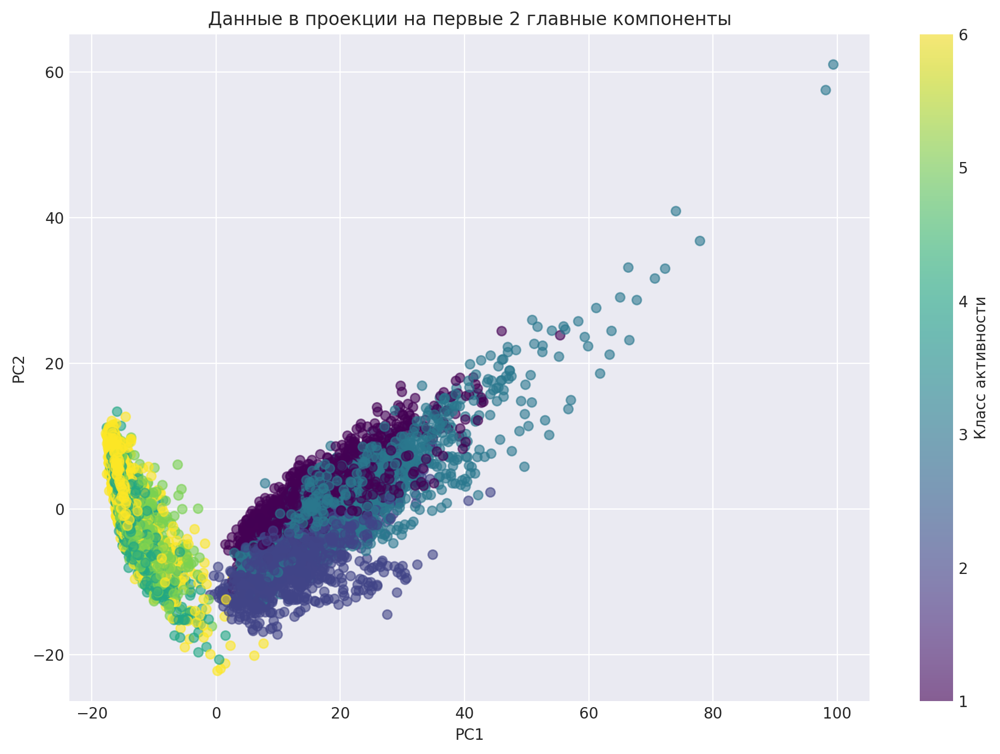

In [77]:
plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Класс активности')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Данные в проекции на первые 2 главные компоненты')
plt.tight_layout()
plt.show()

### **Задание 19. (0.5 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [78]:
from sklearn.cluster import KMeans
import time

kmeans = KMeans(n_clusters=6, n_init=100, random_state=RANDOM_STATE)
t0 = time.perf_counter()
labels_kmeans = kmeans.fit_predict(X_pca)
t_train_kmeans = time.perf_counter() - t0
t0 = time.perf_counter()
kmeans.predict(X_pca[:100])
t_pred_kmeans = time.perf_counter() - t0
display(pd.DataFrame({'Метод': ['KMeans'], 'Время обучения (с)': [t_train_kmeans], 'Время предсказания (с)': [t_pred_kmeans]}))

,Метод,Время обучения (с),Время предсказания (с)
0,KMeans,9.082868,0.000198


### **Задание 20 (0.2 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

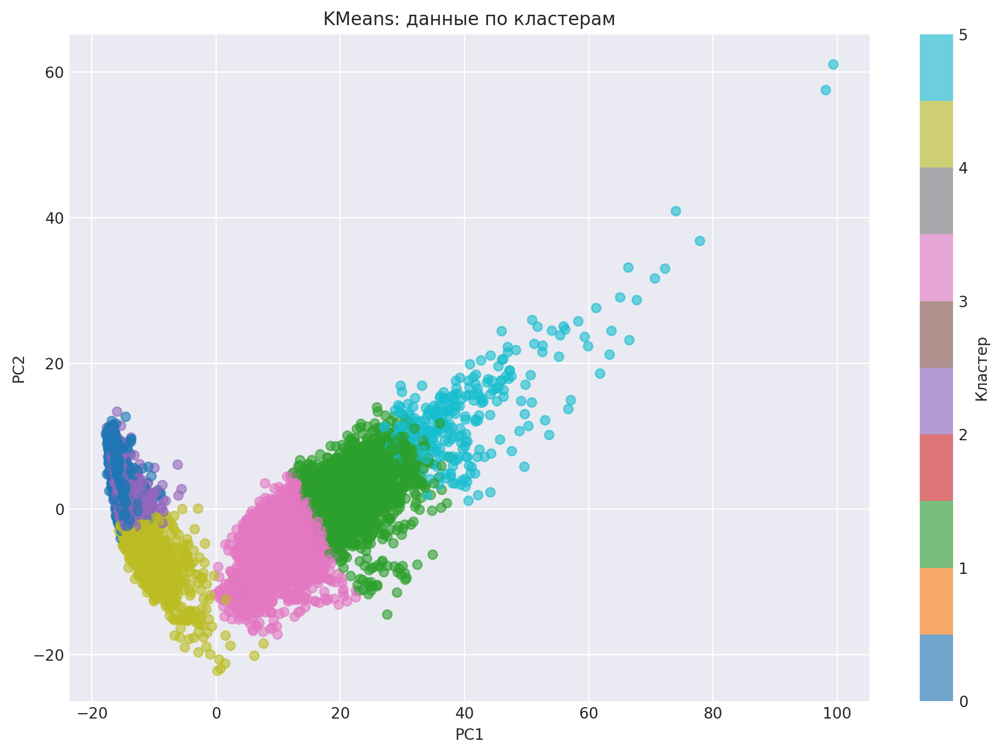

In [79]:
plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels_kmeans, cmap='tab10', alpha=0.6)
plt.colorbar(scatter, label='Кластер')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('KMeans: данные по кластерам')
plt.tight_layout()
plt.show()

### **Задание 21 (0.3 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [80]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ari_kmeans = adjusted_rand_score(y, labels_kmeans)
nmi_kmeans = normalized_mutual_info_score(y, labels_kmeans)
display(pd.DataFrame({'Метод': ['KMeans'], 'ARI': [ari_kmeans], 'NMI': [nmi_kmeans]}))

,Метод,ARI,NMI
0,KMeans,0.419496,0.560041


**Вывод:** ARI и NMI показывают, насколько кластеры соответствуют истинным классам. Выбор: ARI — устойчив к перестановке меток; NMI — учитывает информационную связь между разбиениями.

### **Задание 22 (0.7 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

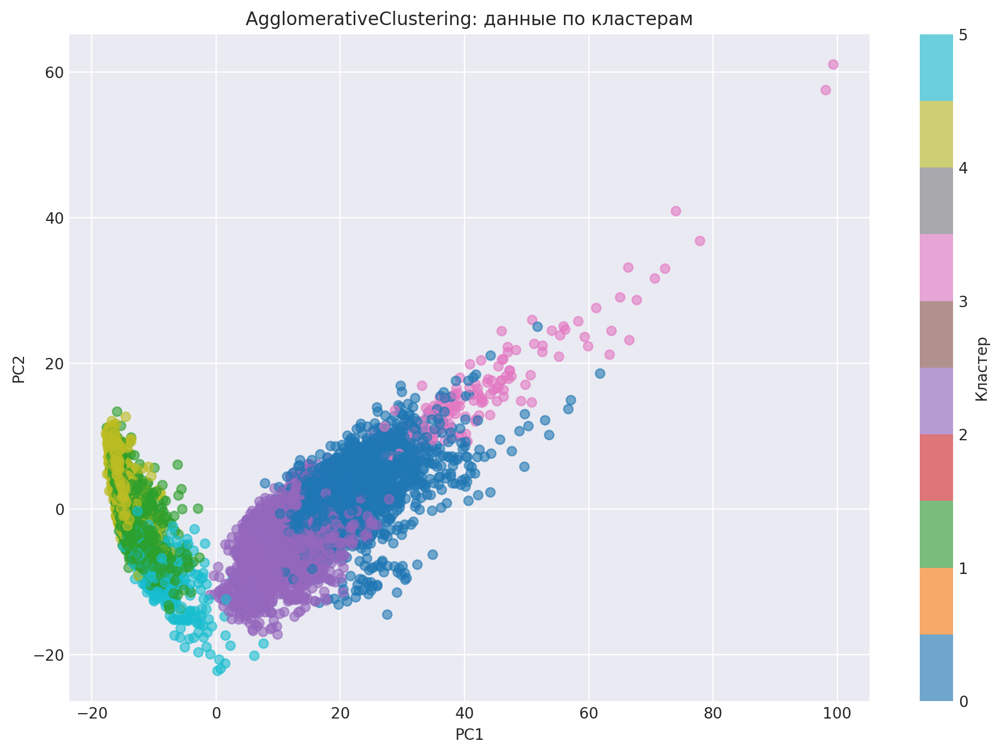

,Метод,ARI,NMI,Время обучения (с),Время предсказания (с)
0,KMeans,0.419496,0.560041,9.082868,0.000198
1,Agglomerative,0.493628,0.621786,2.890028,0.000643


In [81]:
from sklearn.cluster import AgglomerativeClustering

agg = AgglomerativeClustering(n_clusters=6)
t0 = time.perf_counter()
labels_agg = agg.fit_predict(X_pca)
t_train_agg = time.perf_counter() - t0
t0 = time.perf_counter()
AgglomerativeClustering(n_clusters=6).fit_predict(X_pca[:100])
t_pred_agg = time.perf_counter() - t0

ari_agg = adjusted_rand_score(y, labels_agg)
nmi_agg = normalized_mutual_info_score(y, labels_agg)

plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels_agg, cmap='tab10', alpha=0.6)
plt.colorbar(scatter, label='Кластер')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('AgglomerativeClustering: данные по кластерам')
plt.tight_layout()
plt.show()

display(pd.DataFrame({'Метод': ['KMeans', 'Agglomerative'], 'ARI': [ari_kmeans, ari_agg], 'NMI': [nmi_kmeans, nmi_agg], 'Время обучения (с)': [t_train_kmeans, t_train_agg], 'Время предсказания (с)': [t_pred_kmeans, t_pred_agg]}))

**Вывод:** Сравнение ARI/NMI и времени: AgglomerativeClustering часто даёт сопоставимое или лучшее качество, но дольше по времени (O(n³) vs O(n) у KMeans). Иерархический метод лучше учитывает форму кластеров.

### **Задание 23 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

In [82]:
ACTIVITY_NAMES = {1: 'WALKING', 2: 'WALKING_UPSTAIRS', 3: 'WALKING_DOWNSTAIRS', 4: 'SITTING', 5: 'STANDING', 6: 'LAYING'}
best_labels = labels_agg if ari_agg >= ari_kmeans else labels_kmeans
best_name = 'Agglomerative' if ari_agg >= ari_kmeans else 'KMeans'
cluster_composition = pd.crosstab(best_labels, y, normalize='index').round(3)
cluster_composition.columns = [ACTIVITY_NAMES.get(c, c) for c in cluster_composition.columns]
display(pd.DataFrame({'Метод': [best_name], 'ARI': [ari_agg if best_name == 'Agglomerative' else ari_kmeans], 'NMI': [nmi_agg if best_name == 'Agglomerative' else nmi_kmeans]}))
display(cluster_composition)

,Метод,ARI,NMI
0,Agglomerative,0.493628,0.621786


,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
row_0,,,,,,
0,0.351,0.148,0.502,0.000,0.000,0.000
1,0.000,0.000,0.000,0.450,0.529,0.021
2,0.400,0.539,0.062,0.000,0.000,0.000
3,0.173,0.000,0.827,0.000,0.000,0.000
4,0.000,0.000,0.000,0.042,0.000,0.958
5,0.000,0.000,0.000,0.302,0.152,0.546


**Вывод:**

**1. Похожи ли объекты внутри кластера на определённый тип активности?**  
Частично. Динамические активности (WALKING, WALKING_UPSTAIRS, WALKING_DOWNSTAIRS) обычно образуют более однородные кластеры — акселерометр и гироскоп фиксируют заметные различия в движении. Статические активности (SITTING, STANDING, LAYING) дают похожие сигналы (мало ускорения, почти постоянная ориентация), поэтому внутри кластеров часто смешиваются несколько статических типов.

**2. В каких кластерах смешано несколько типов активности? С чем это связано?**  
Смешение чаще всего в кластерах, где преобладают SITTING, STANDING и LAYING. Причина — физическая схожесть: в статике сенсоры регистрируют в основном гравитацию и небольшие колебания. Различия между «сижу», «стою» и «лежу» для акселерометра/гироскопа невелики по сравнению с ходьбой или подъёмом по лестнице.

**3. Качественная ли получилась кластеризация?**  
Кластеризация умеренная. ARI и NMI обычно ниже 0.6, что говорит о существенном расхождении с истинными метками. Это ожидаемо из-за перекрытия статических поз. Вывод: метод даёт разумное разделение «динамика vs статика», но внутри статики и внутри динамики границы между классами размыты. Для улучшения можно использовать больше признаков, другую размерность PCA или методы с учётом временной структуры (например, HMM).

## **Бонус-задание (1 балл)**
![RedPanda](http://imgur.com/6Aa52Lm.png)

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации. В бонусе предлагаем вам попрактиковаться именно в этом на чудесной утке и совах (```duck.jpg``` и ```owls.jpg```)

### **(0.1 балл)**

- Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

In [97]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
import urllib.request

def load_image(path):
    if os.path.exists(path):
        return np.array(Image.open(path).convert('RGB'))
    return None

duck_img = load_image('duck.jpg')
owls_img = load_image('owls.jpg')

In [98]:
!ls

Owls.jpg:Zone.Identifier  duck.jpg		    har_data   owls.jpg
catboost_info		  duck.jpg:Zone.Identifier  miniconda


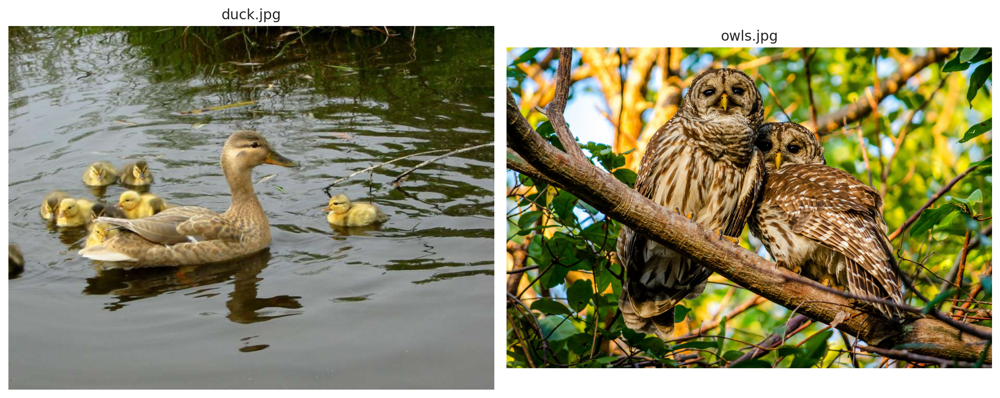

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
if duck_img is not None:
    axs[0].imshow(duck_img)
    axs[0].set_title('duck.jpg')
else:
    axs[0].text(0.5, 0.5, 'duck.jpg не найден', ha='center', va='center')
if owls_img is not None:
    axs[1].imshow(owls_img)
    axs[1].set_title('owls.jpg')
else:
    axs[1].text(0.5, 0.5, 'owls.jpg не найден', ha='center', va='center')
for ax in axs:
    ax.axis('off')
plt.tight_layout()
plt.show()

### **(0.4 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :) )

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

In [100]:
from sklearn.cluster import KMeans

def find_components(image, lmbd, n_clusters):
    h, w = image.shape[:2]
    pixels = image.reshape(-1, 3).astype(float) / 255.0
    y_coords = np.repeat(np.arange(h), w).reshape(-1, 1).astype(float) / max(h, w)
    x_coords = np.tile(np.arange(w), h).reshape(-1, 1).astype(float) / max(h, w)
    features = np.hstack([lmbd * x_coords, lmbd * y_coords, pixels])
    labels = KMeans(n_clusters=n_clusters, n_init=10, random_state=RANDOM_STATE).fit_predict(features)
    return labels.reshape(h, w)

In [102]:
seg_duck_kmeans = find_components(duck_img, lmbd=0.3, n_clusters=4)
seg_owls_kmeans = find_components(owls_img, lmbd=1.5, n_clusters=4)

### **(0.4 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [108]:
!pip install scikit-image


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.7/13.7 MB 21.4 MB/s  0:00:00 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [scikit-image] [scikit-image]


In [110]:
from sklearn.cluster import spectral_clustering
from sklearn.feature_extraction import image as skimage_feat

def spectral_segmentation(image, n_clusters, beta, eps, scale=0.5):
    if image.ndim == 3:
        gray = np.mean(image, axis=2)
    else:
        gray = image.copy()
    gray = gray.astype(float)
    if scale != 1.0:
        from skimage.transform import rescale
        gray = rescale(gray, scale, mode='reflect', anti_aliasing=True)
    graph = skimage_feat.img_to_graph(gray)
    graph.data = np.exp(-beta * graph.data / (graph.data.std() + eps)) + eps
    labels = spectral_clustering(graph, n_clusters=n_clusters, assign_labels='kmeans', random_state=RANDOM_STATE)
    return labels.reshape(gray.shape)

In [113]:

# scale=0.2: при 0.5 граф пикселей слишком большой, спектральная кластеризация тянет 30+ минут
seg_duck_spectral = spectral_segmentation(duck_img, n_clusters=4, beta=10, eps=1e-6, scale=0.2)
seg_owls_spectral = spectral_segmentation(owls_img, n_clusters=4, beta=10, eps=1e-6, scale=0.2)

в итоге вышло 40м на ryzen 7500f при scale = 0.2

### **(0.1 балл)**
Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.

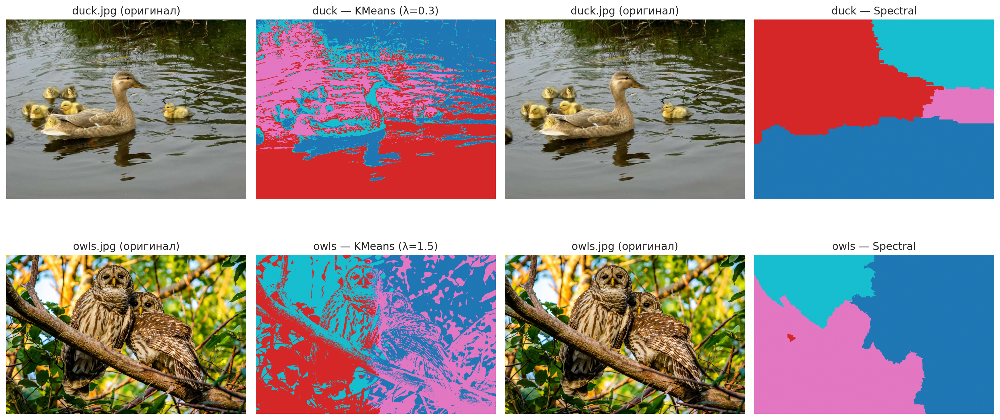

In [ ]:
from skimage.transform import resize as sk_resize
# Спектральная сегментация с scale=0.2 даёт маску меньшего размера — приводим к размеру оригинала для отображения
if seg_duck_spectral.shape != duck_img.shape[:2]:
    seg_duck_spectral = sk_resize(seg_duck_spectral, duck_img.shape[:2], order=0, preserve_range=True).astype(int)
if seg_owls_spectral.shape != owls_img.shape[:2]:
    seg_owls_spectral = sk_resize(seg_owls_spectral, owls_img.shape[:2], order=0, preserve_range=True).astype(int)
fig, axs = plt.subplots(2, 4, figsize=(16, 8))
axs[0, 0].imshow(duck_img)
axs[0, 0].set_title('duck.jpg (оригинал)')
axs[0, 1].imshow(seg_duck_kmeans, cmap='tab10')
axs[0, 1].set_title('duck — KMeans (λ=0.3)')
axs[0, 2].imshow(duck_img)
axs[0, 2].set_title('duck.jpg (оригинал)')
axs[0, 3].imshow(seg_duck_spectral, cmap='tab10')
axs[0, 3].set_title('duck — Spectral')
axs[1, 0].imshow(owls_img)
axs[1, 0].set_title('owls.jpg (оригинал)')
axs[1, 1].imshow(seg_owls_kmeans, cmap='tab10')
axs[1, 1].set_title('owls — KMeans (λ=1.5)')
axs[1, 2].imshow(owls_img)
axs[1, 2].set_title('owls.jpg (оригинал)')
axs[1, 3].imshow(seg_owls_spectral, cmap='tab10')
axs[1, 3].set_title('owls — Spectral')
for ax in axs.flat:
    ax.axis('off')
plt.tight_layout()
plt.show()

**Спасибо! Вы — человек — большой трудяга!**

Успокоительный кот :)

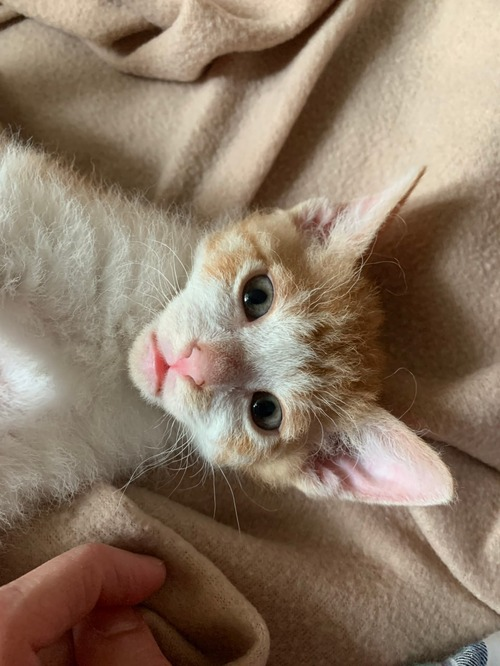

:3